In [72]:
from PIL import Image     # Python Image Library
import numpy as np
import matplotlib.pyplot as plt
import sys
import math

In [73]:
images = []
images.append(Image.open('lena.jpg'))
images.append(Image.open('dark_book.jpg'))
images.append(Image.open('giant.jpg'))
images.append(Image.open('spy.jpg'))
images.append(Image.open('noise_1.png'))


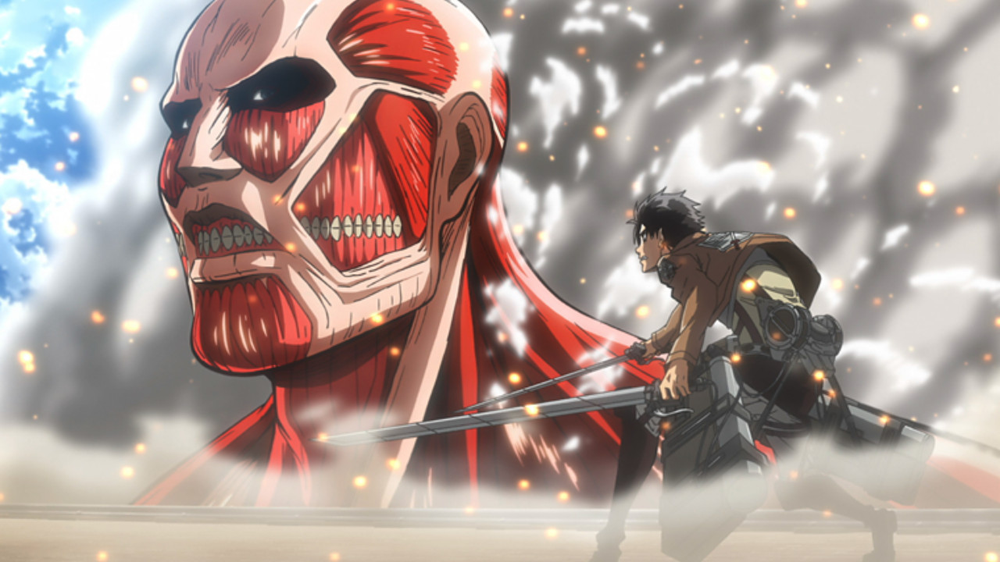

In [74]:
images[2]

In [75]:
def Intensity_Transformation(image, Gamma = 1, C = 1):
    
    input = np.array(image) 

                
    intensity = lambda p: 255*(C*(p/255)**Gamma)
    output = intensity(input)
    
    output = np.clip(output, 0, 255)
    output_image = Image.fromarray(output.astype('uint8'))
    return output_image

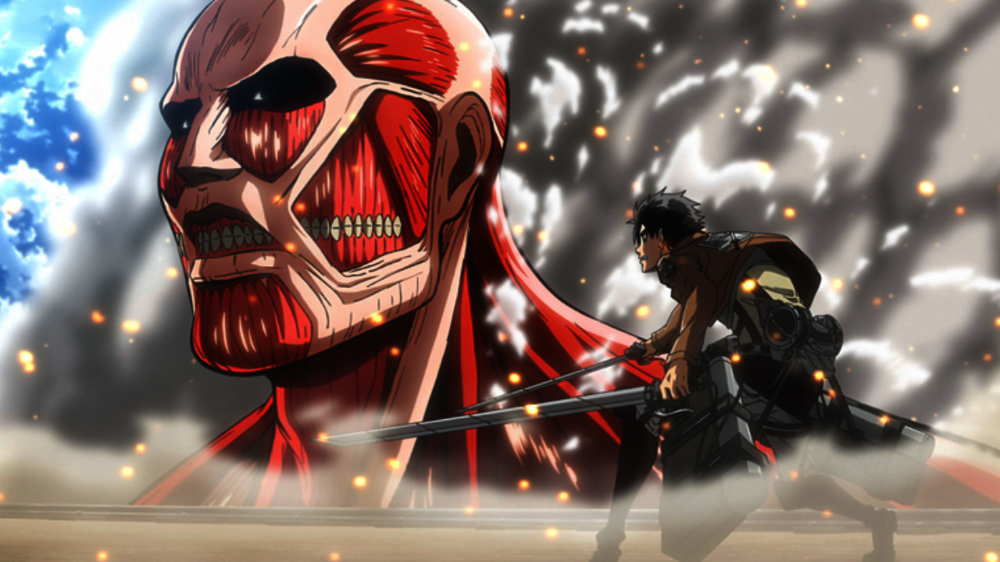

In [76]:
Intensity_Transformation(images[2],2,1)

# histogram_equalization

In [77]:
#gray only
def histogram_equalization(image, plot_bar = False):
    image_array = np.array(image)
    height, width =image_array.shape
        
    counts = np.zeros(256)
    for i in range(height):
        for j in range(width):
            counts[image_array[i,j]]+=1
        
    pdf = counts/image_array.size
    cdf = np.cumsum(pdf)
    image_array = 255*cdf[image_array] # (L-1)*cdf
        
    output = Image.fromarray(image_array.astype('uint8'))
        
    if plot_bar:
        plotBar(range(256),pdf,title = 'origin histograms pdf')
        unique, counts = np.unique(image_array, return_counts=True)
        plotBar(unique,counts/image_array.size, title = 'output histograms pdf')
        
    return output

In [78]:
def plotBar(x,y,title=None):
    plt.bar(x,y)
    plt.title(title)
    plt.show()

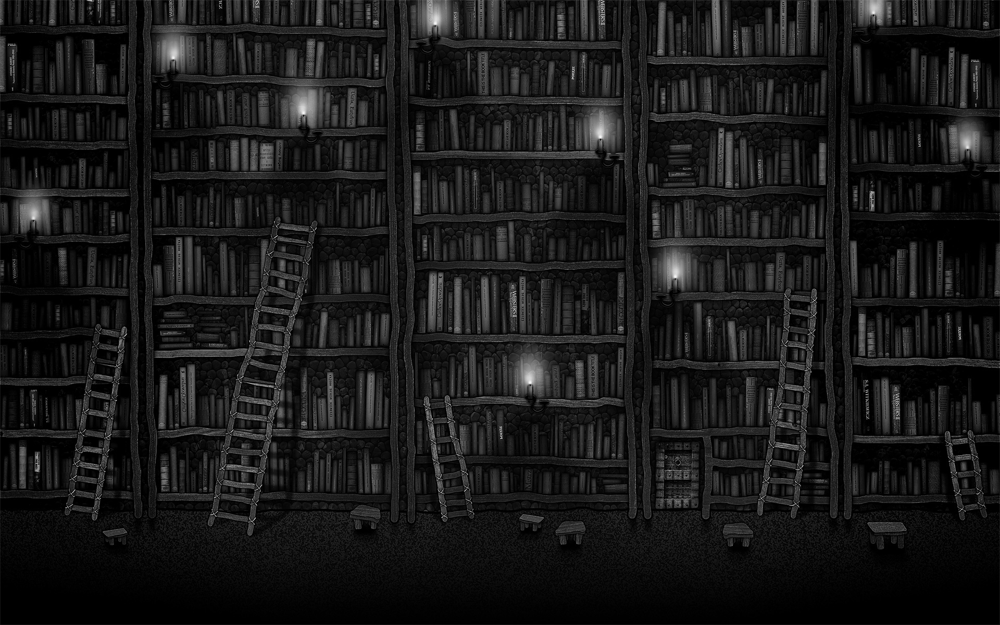

In [79]:
images[1].convert('L')

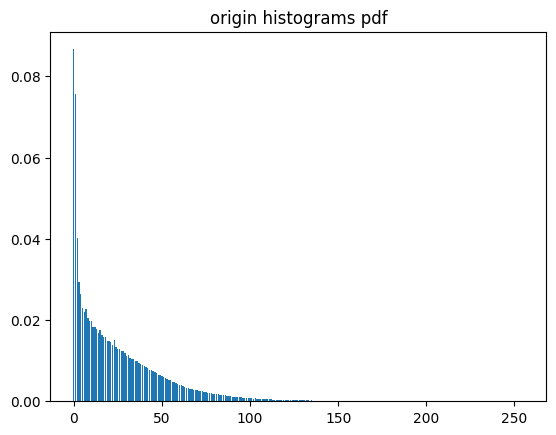

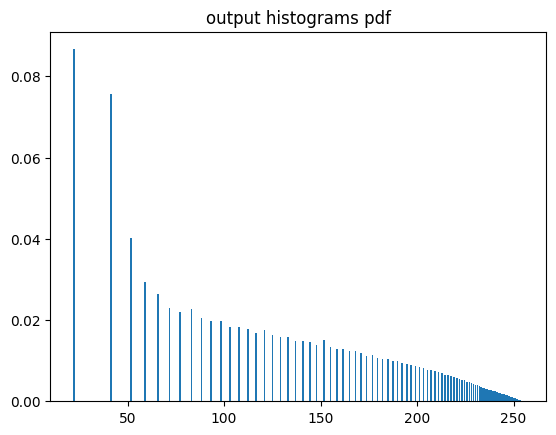

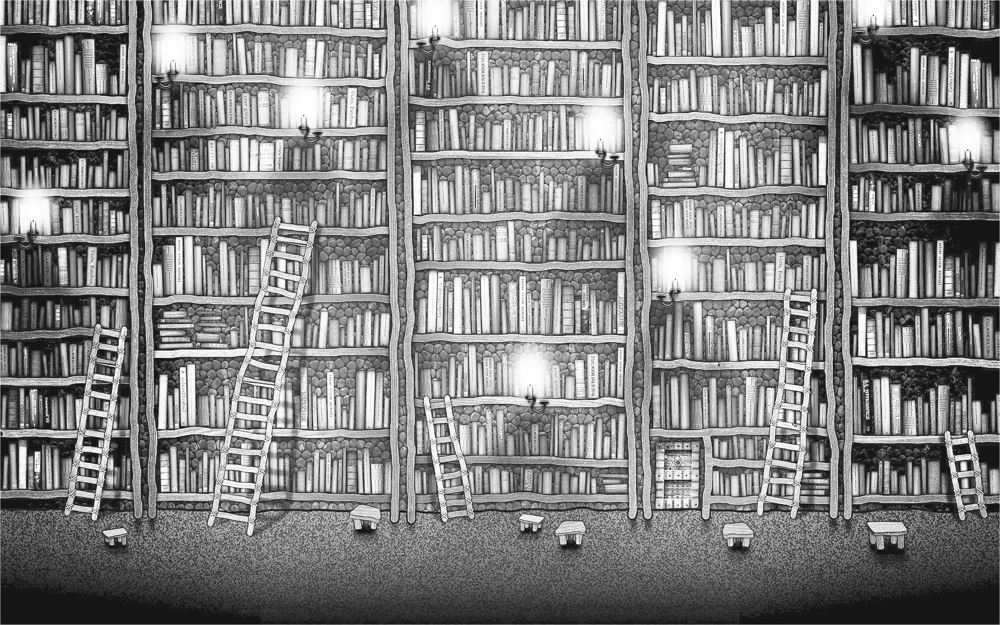

In [26]:
histogram_equalization(images[1].convert('L'), plot_bar=True)

# color_correction

In [80]:
def color_correction(image, gamma = [1,1,1], c = [1,1,1]):
    image_array = np.array(image)
    output_array = np.zeros_like(image_array)
    height, width, channel = image_array.shape
    for i in range(channel):
        output_array[:,:,i] = Intensity_Transformation(image_array[:,:,i], gamma[i], c[i])
    output = Image.fromarray(output_array)
    return output

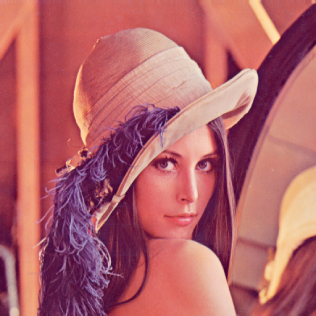

In [81]:
color_correction(images[0], gamma = [1,1,1], c = [1,1,1])

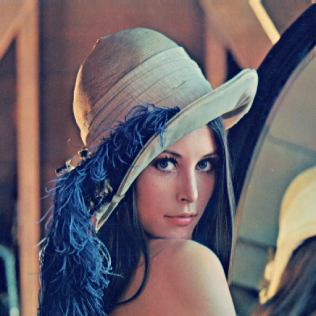

In [82]:
color_correction(images[0], gamma = [3,1,1], c = [1,1,1])

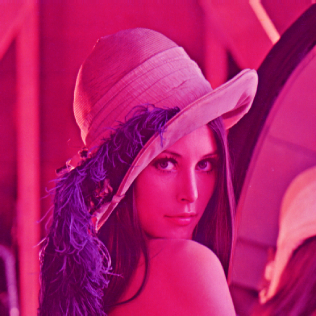

In [83]:
color_correction(images[0], gamma = [1,3,1], c = [1,1,1])

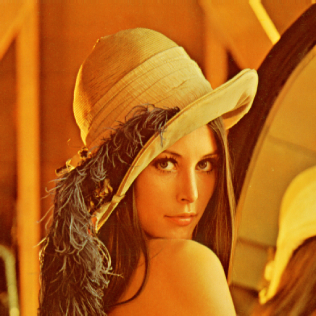

In [84]:
color_correction(images[0], gamma = [1,1,3], c = [1,1,1])

In [85]:
def Gaussian_noise(image, strength):
    image_array = np.array(image)/255
    
    noise = np.random.normal(0, strength, image_array.shape)
   
    output_array = image_array + noise
    output_array = np.clip(output_array, 0, 1)*255
    output = Image.fromarray(output_array.astype('uint8'))
    return output   

In [86]:
def Salt_Pepper_noise(image, strength):
    image_array = np.array(image)/255
   
    
    noise = np.random.choice([-2,0,2],image_array.shape[0:2], p = [strength/2, 1-strength, strength/2])
    if len(image_array.shape) == 3:
        noise = np.repeat(noise[:,:,np.newaxis], 3, axis=2)  
    output_array = image_array + noise
    output_array = np.clip(output_array, 0, 1)*255
    output = Image.fromarray(output_array.astype('uint8'))
    return output   

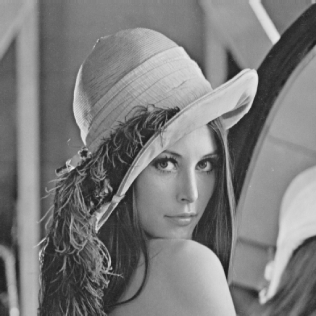

In [87]:
images[0].convert('L')


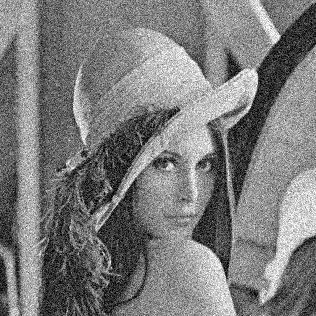

In [89]:
lena_gauss = Gaussian_noise(images[0].convert('L'), strength = 0.1)
lena_gauss

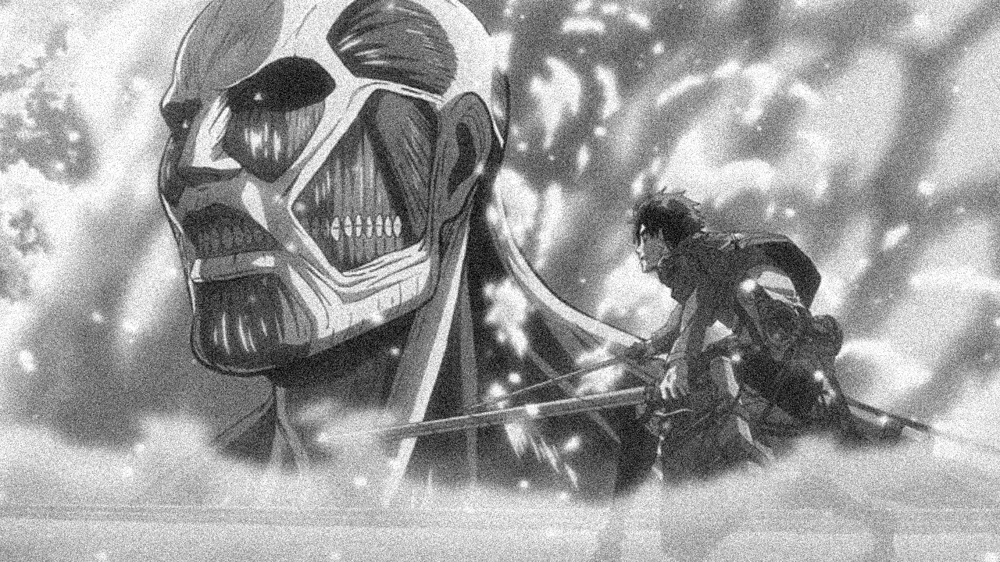

In [90]:
giant_gauss = Gaussian_noise(images[2].convert('L'), strength = 0.1)
giant_gauss

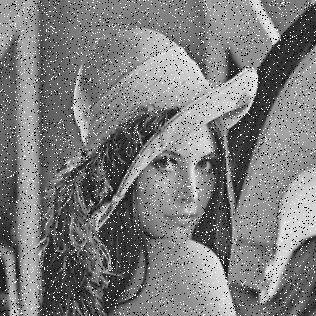

In [91]:
lena_spn = Salt_Pepper_noise(images[0].convert('L'), strength = 0.1)
lena_spn

# Order Statistics Filters


In [92]:
def median_filter(image, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data= np.array(image)
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[len(temp) // 2]
            temp = []
            output_array = np.clip(data_final, 0, 255)
            output = Image.fromarray(output_array.astype('uint8'))
            
    return output

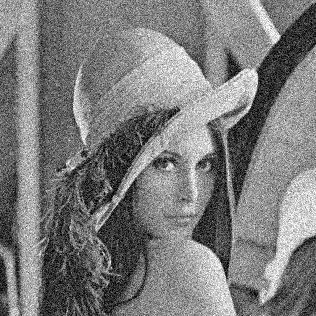

In [93]:
lena_gauss

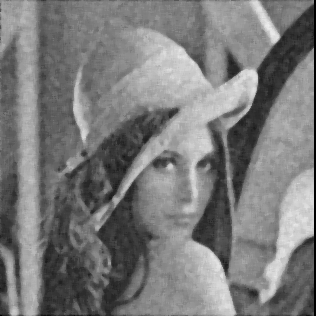

In [94]:
median_filter(lena_gauss,5)

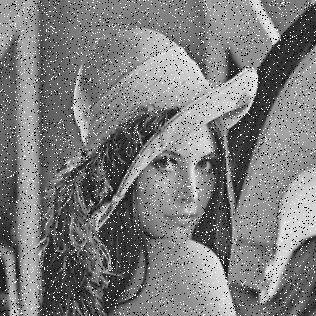

In [95]:
lena_spn.convert('L')

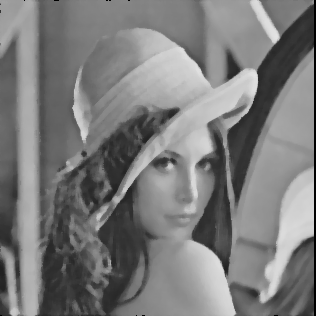

In [96]:
median_filter(lena_spn.convert('L'),5)


In [97]:
def min_filter(image, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data= np.array(image)
    data_final = np.zeros((len(data),len(data[0])))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort()
            data_final[i][j] = temp[0]
            temp = []
            output_array = np.clip(data_final, 0, 255)
            output = Image.fromarray(output_array.astype('uint8'))
            
    return output

In [98]:
def max_filter(image, filter_size):
    temp = []
    indexer = filter_size // 2
    data_final = []
    data= np.array(image)
    data_final = np.zeros((len(data),len(data[0])))
    print(len(data))
    print(len(data[0]))
    for i in range(len(data)):

        for j in range(len(data[0])):

            for z in range(filter_size):
                if i + z - indexer < 0 or i + z - indexer > len(data) - 1:
                    for c in range(filter_size):
                        temp.append(0)
                else:
                    if j + z - indexer < 0 or j + indexer > len(data[0]) - 1:
                        temp.append(0)
                    else:
                        for k in range(filter_size):
                            temp.append(data[i + z - indexer][j + k - indexer])

            temp.sort(reverse=True)
            data_final[i][j] = temp[0]
            temp = []
            output_array = np.clip(data_final, 0, 255)
            output = Image.fromarray(output_array.astype('uint8'))
            
    return output

316
316


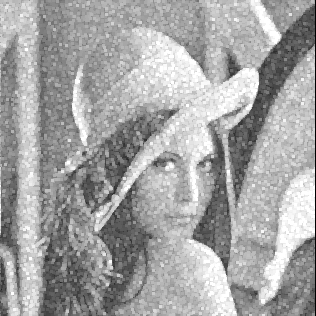

In [99]:
max_filter(lena_gauss,3)

316
316


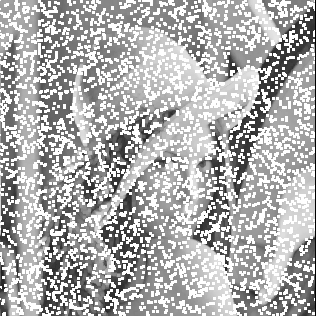

In [100]:
max_filter(lena_spn,3)

440
455


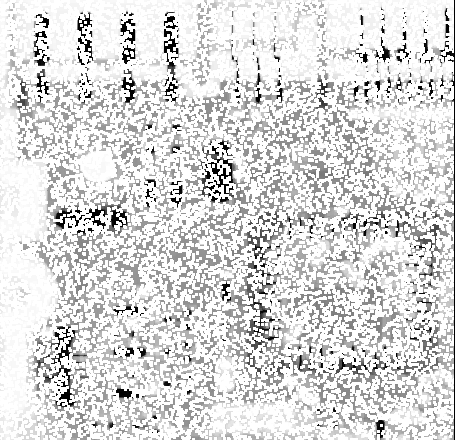

In [132]:
max_filter(images[4],3)

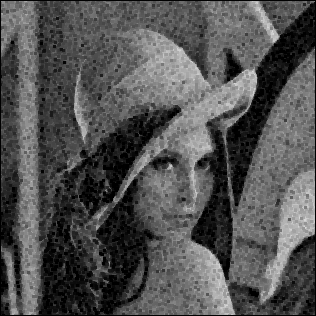

In [101]:
min_filter(lena_gauss,3)

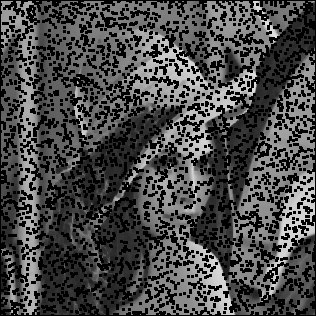

In [102]:
min_filter(lena_spn,3)

In [103]:
def average_filter(data):     
    img= np.array(data)

    height, width = img.shape
    
    # Develop Averaging filter(3, 3) mask
    mask = np.ones([3, 3], dtype = int)
    mask = mask / 9
    
    # Convolve the 3X3 mask over the image
    img_new = np.zeros([height, width])
    
    for i in range(1, height-1):
        for j in range(1, width-1):
            temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]
            
            img_new[i, j]= temp
    
    img_new = np.clip(img_new, 0, 255)  
    output = Image.fromarray(img_new.astype('uint8'))      
    
    return output



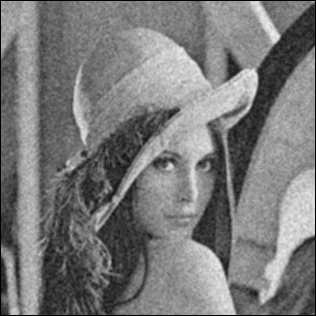

In [104]:
average_filter(lena_gauss)

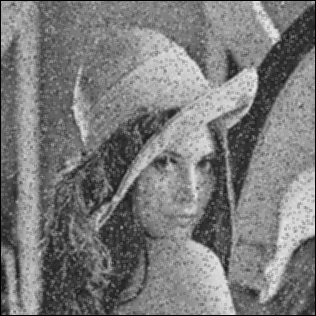

In [105]:
average_filter(lena_spn)

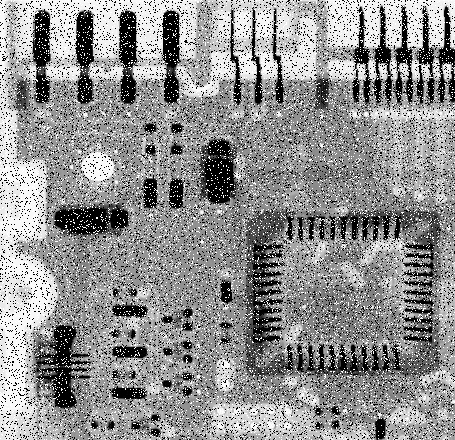

In [130]:
images[4]

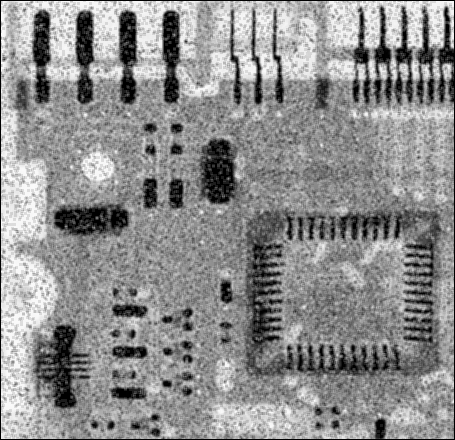

In [128]:
average_filter(images[4])

# Laplacian_filter

In [106]:

def sharpen_filter(data):     
    img= np.array(data)

    height, width = img.shape
    
    # Develop Averaging filter(3, 3) mask
    mask = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    mask = mask / 9
    
    # Convolve the 3X3 mask over the image
    img_new = np.zeros([height, width])
    
    for i in range(1, height-1):
        for j in range(1, width-1):
            temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]
            
            img_new[i, j]= temp
    
    img_new = np.clip(img_new, 0, 255)  
    output = Image.fromarray(img_new.astype('uint8'))      
    
    return output

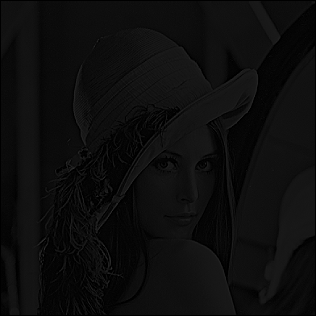

In [107]:
sharpen_filter(images[0].convert('L'))


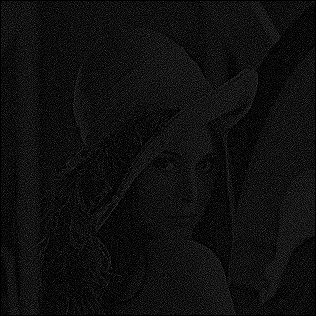

In [108]:
sharpen_filter(lena_gauss)


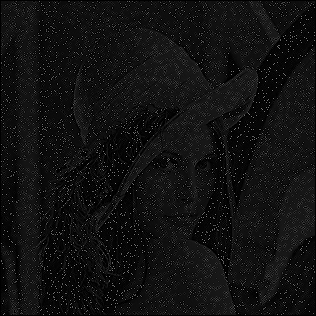

In [109]:
sharpen_filter(lena_spn)

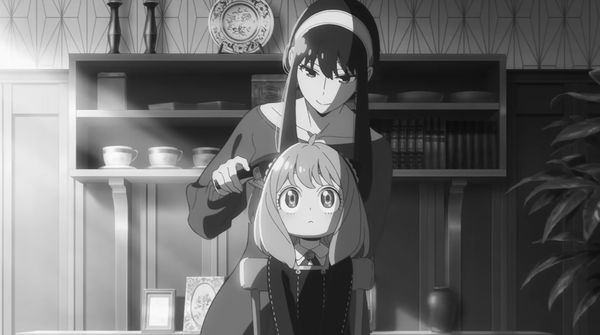

In [110]:
images[3].convert('L')

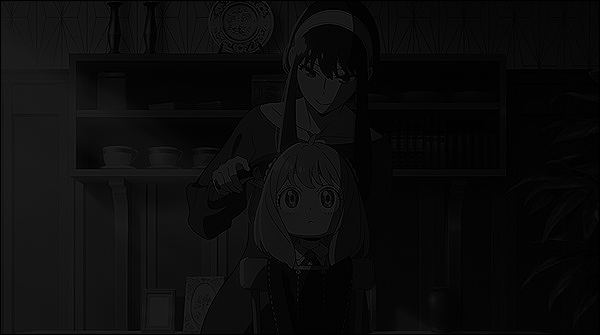

In [111]:
sharpen_filter(images[3].convert('L'))

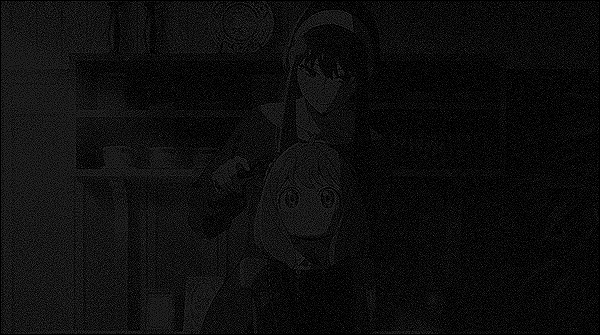

In [112]:
spy_gauss = Gaussian_noise(images[3].convert('L'), strength = 0.1)
sharpen_filter(spy_gauss)

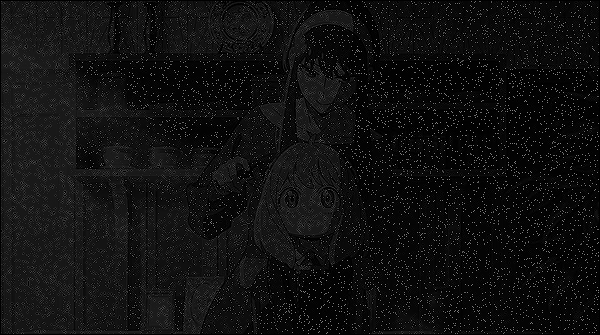

In [113]:
spy_spn = Salt_Pepper_noise(images[3].convert('L'), strength = 0.1)
sharpen_filter(spy_spn)

In [114]:
def Laplacian_filter2(data):     
    img= np.array(data)

    height, width = img.shape
    
    # Develop Averaging filter(3, 3) mask
    mask = np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])
    mask = mask / 9
    
    # Convolve the 3X3 mask over the image
    img_new = np.zeros([height, width])
    
    for i in range(1, height-1):
        for j in range(1, width-1):
            temp = img[i-1, j-1]*mask[0, 0]+img[i-1, j]*mask[0, 1]+img[i-1, j + 1]*mask[0, 2]+img[i, j-1]*mask[1, 0]+ img[i, j]*mask[1, 1]+img[i, j + 1]*mask[1, 2]+img[i + 1, j-1]*mask[2, 0]+img[i + 1, j]*mask[2, 1]+img[i + 1, j + 1]*mask[2, 2]
            
            img_new[i, j]= temp
    
    img_new = np.clip(img_new, 0, 255)  
    output = Image.fromarray(img_new.astype('uint8'))      
    
    return output

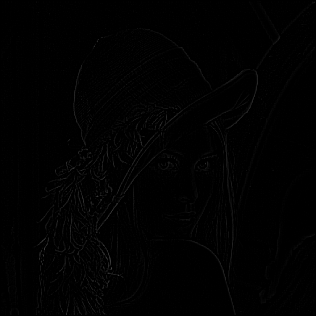

In [115]:
Laplacian_filter2(images[0].convert('L'))

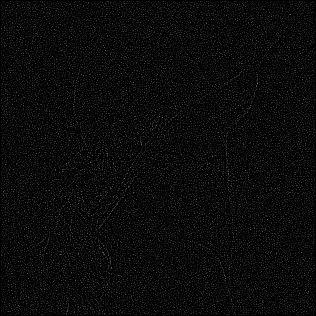

In [116]:
Laplacian_filter2(lena_gauss)


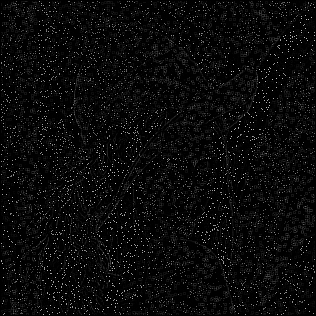

In [117]:
Laplacian_filter2(lena_spn)

In [118]:
def Gaussian_Filter(data,k_size = (3,3), sigma = 1):
    
    k_height = (k_size[0]-1)/2
    k_width = (k_size[1]-1)/2
    mask = np.zeros(k_size)
    for i in range(k_size[0]):
        for j in range(k_size[1]):
            mask[i,j] = (1/(2*math.pi*(sigma**2)))*math.exp(-((i-k_height)**2+(j-k_width)**2)/(2*sigma**2))
            
    img= np.array(data)
    height, width = img.shape

    img_new = np.zeros([height, width])
    for i in range(height-k_size[0]+1):
        for j in range(width-k_size[1]+1):
            img_new[i,j] = np.sum(img[i:i+k_size[0],j:j+k_size[1]]*mask)
            
    img_new = np.clip(img_new, 0, 255)  
    output = Image.fromarray(img_new.astype('uint8'))      
    
    return output

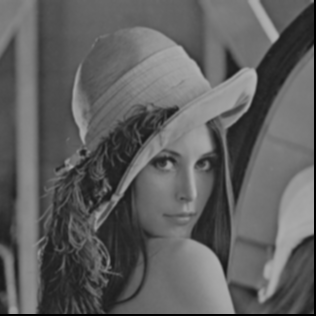

In [119]:
Gaussian_Filter(images[0].convert('L'),k_size = (3,3), sigma = 1)


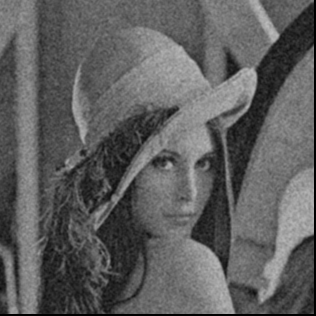

In [120]:
Gaussian_Filter(lena_gauss,k_size = (3,3), sigma = 1)

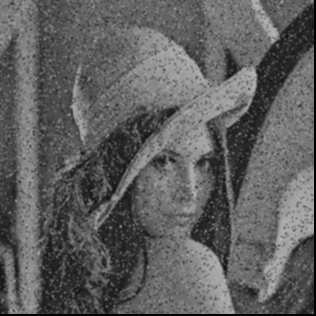

In [121]:
Gaussian_Filter(lena_spn,k_size = (3,3), sigma = 1)

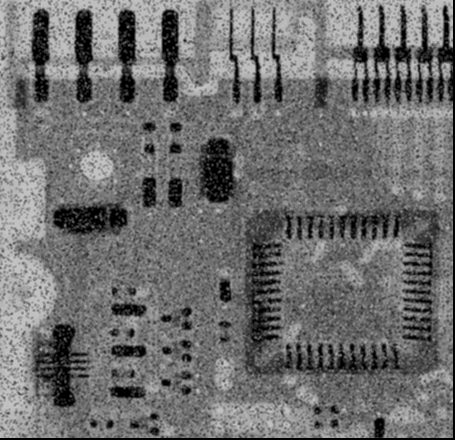

In [131]:
Gaussian_Filter(images[4],k_size = (3,3), sigma = 1)


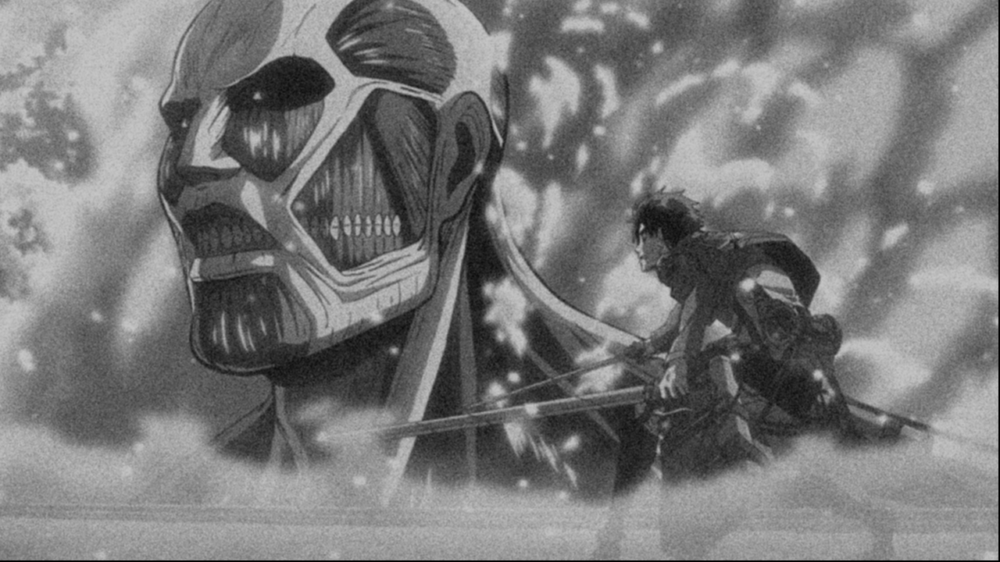

In [122]:
Gaussian_Filter(giant_gauss,k_size = (3,3), sigma = 1)

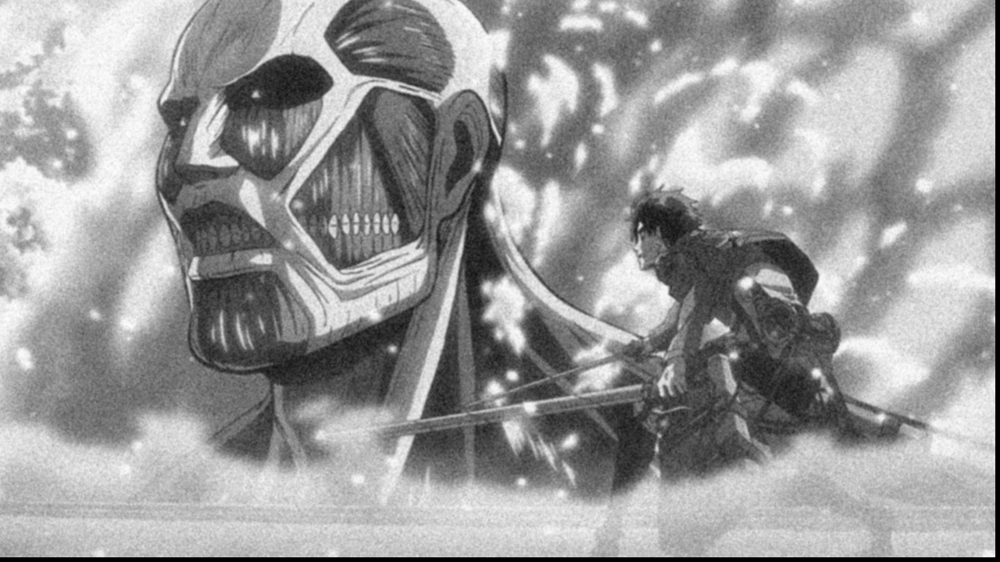

In [123]:
Gaussian_Filter(giant_gauss,k_size = (7,7), sigma = 1)

In [124]:
def Adaptive_Medium_filter(data,k_size = (3,3), sigma = 1):
    
    k_height = (k_size[0]-1)/2
    k_width = (k_size[1]-1)/2
    
    img= np.array(data)
    height, width = img.shape
    img_new = np.zeros([height, width])
    
    for x in range(height-k_size[0]+1):
        for y in range(width-k_size[1]+1):    
            Z_xy = img[x+(k_size[0]-1)//2,y+(k_size[1]-1)//2]
            i = 0 #increase
            while(x-i>=0 and x+k_size[0]+i<height and y-i>=0 and y+k_size[1]+i<width):
                z_min = np.min(img[x-i:x+k_size[0]+i,y-i:y+k_size[1]+i])
                z_max = np.max(img[x-i:x+k_size[0]+i,y-i:y+k_size[1]+i])
                z_med = np.median(img[x-i:x+k_size[0]+i,y-i:y+k_size[1]+i])
                if(not(z_min<z_med and z_med<z_max)):
                    i += 1
                else: #Level b
                    if(z_min<Z_xy and Z_xy<z_max):
                        img_new[x,y] = Z_xy
                    else:
                        img_new[x,y] = z_med
                    break;
            else:
                img_new[x,y] = z_med
    

    
   # for i in range(height-k_size[0]+1):
       # for j in range(width-k_size[1]+1):
            #img_new[i,j] = np.sum(img[i:i+k_size[0],j:j+k_size[1]]*mask)
            
    img_new = np.clip(img_new, 0, 255)  
    output = Image.fromarray(img_new.astype('uint8'))      
    
    return output

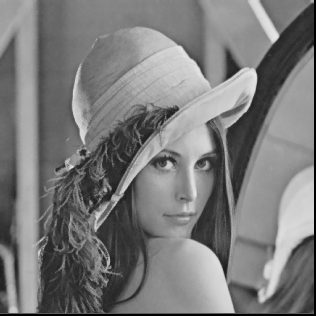

In [125]:
Adaptive_Medium_filter(images[0].convert('L'),k_size = (3,3), sigma = 1)


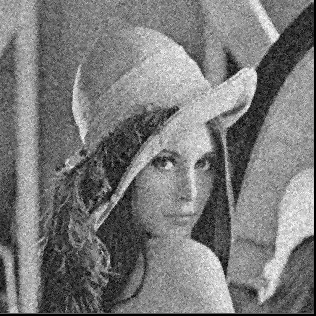

In [126]:
Adaptive_Medium_filter(lena_gauss,k_size = (3,3), sigma = 1)

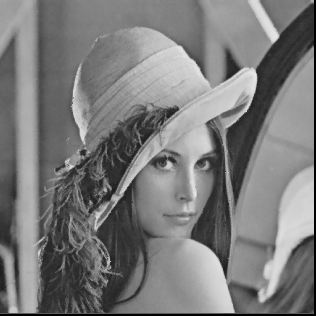

In [127]:
Adaptive_Medium_filter(lena_spn,k_size = (3,3), sigma = 1)